In [1]:
import sys
sys.path.append('/mnt/data01/Code/')
import NDH_Tools as ndh

import glob
import numpy as np
import matplotlib.pyplot as plt

In [8]:
filelist = sorted(glob.glob('/mnt/data01/Data/RadarData/Greenland/*/CSARP_music3D_ndh_v2/*/Data_2*.mat'))

if 0:
    ndh.process_FromList_offnadir_pickedpdf(['./Picked/ListedFrames.pdf'],filelist,'./Picks')

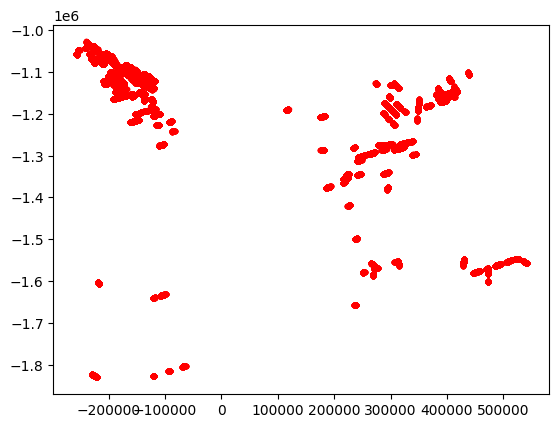

In [18]:
pick_files = glob.glob('./Picks/*.mat')
for pf in pick_files:
    pick = ndh.loadmat(pf)
    xy = ndh.polarstereo_fwd(pick['Latitude'],pick['Longitude'])
    for pvals in pick['picks']:
        ki = np.where(~np.isnan(pvals))
        plt.plot(xy['x'][ki],xy['y'][ki],'.',c='red')

In [14]:
pick

{'Elevation': array([3079.34892926, 3079.28324716, 3079.21956107, ..., 2866.61320014,
        2866.50627321, 2866.39964305]),
 'Latitude': array([73.40829046, 73.40823465, 73.40817887, ..., 73.2111476 ,
        73.21108958, 73.21103158]),
 'Longitude': array([-47.40347396, -47.40390167, -47.40432943, ..., -48.80097965,
        -48.80139892, -48.80181822]),
 'picks': [array([nan, nan, nan, ..., nan, nan, nan]),
  array([nan, nan, nan, ..., nan, nan, nan])]}

In [3]:
pick_files

['./Picks/Data_20130423_01_034.mat',
 './Picks/Data_20140515_02_021.mat',
 './Picks/Data_20110509_02_014.mat',
 './Picks/Data_20120404_01_018.mat',
 './Picks/Data_20100330_07_002.mat',
 './Picks/Data_20110329_02_004.mat',
 './Picks/Data_20110329_02_005.mat',
 './Picks/Data_20140515_02_053.mat',
 './Picks/Data_20100324_01_011.mat',
 './Picks/Data_20140515_02_047.mat',
 './Picks/Data_20100525_02_005.mat',
 './Picks/Data_20110502_02_014.mat',
 './Picks/Data_20100324_01_017.mat',
 './Picks/Data_20100324_02_001.mat',
 './Picks/Data_20110507_01_024.mat',
 './Picks/Data_20110502_02_008.mat',
 './Picks/Data_20110507_01_017.mat',
 './Picks/Data_20110509_02_017.mat',
 './Picks/Data_20100525_06_012.mat',
 './Picks/Data_20110429_02_008.mat',
 './Picks/Data_20120503_03_057.mat',
 './Picks/Data_20100324_01_036.mat',
 './Picks/Data_20110507_01_037.mat',
 './Picks/Data_20100324_01_020.mat',
 './Picks/Data_20110429_01_027.mat',
 './Picks/Data_20110502_01_037.mat',
 './Picks/Data_20130423_01_021.mat',
 

ERROR:root:ERROR: MATLAB type not supported: function_handle_workspace, (uint32)
ERROR:root:ERROR: MATLAB type not supported: function_handle_workspace, (uint32)
ERROR:root:ERROR: MATLAB type not supported: function_handle_workspace, (uint32)
ERROR:root:ERROR: MATLAB type not supported: function_handle_workspace, (uint32)
ERROR:root:ERROR: MATLAB type not supported: function_handle_workspace, (uint32)
ERROR:root:ERROR: MATLAB type not supported: function_handle_workspace, (uint32)


<Figure size 640x480 with 0 Axes>

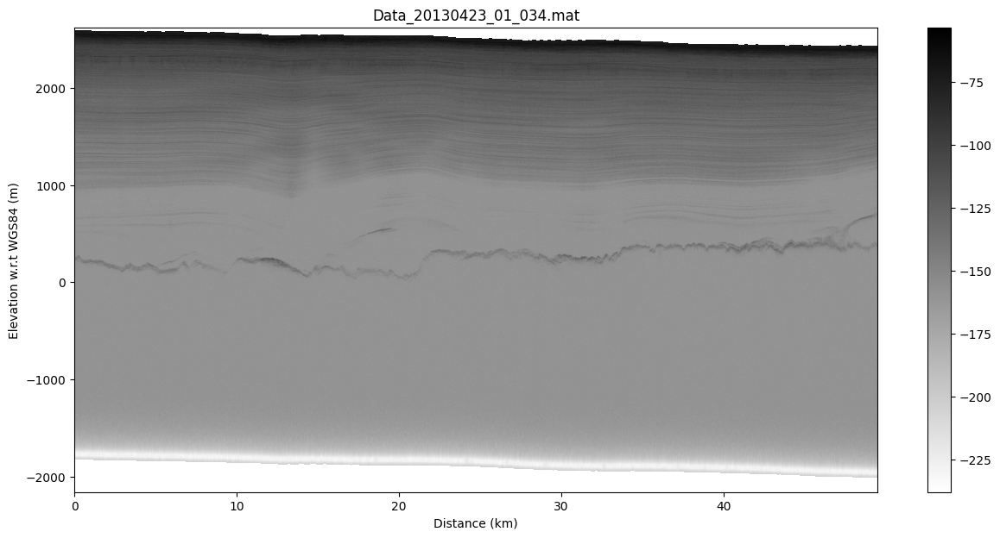

<Figure size 640x480 with 0 Axes>

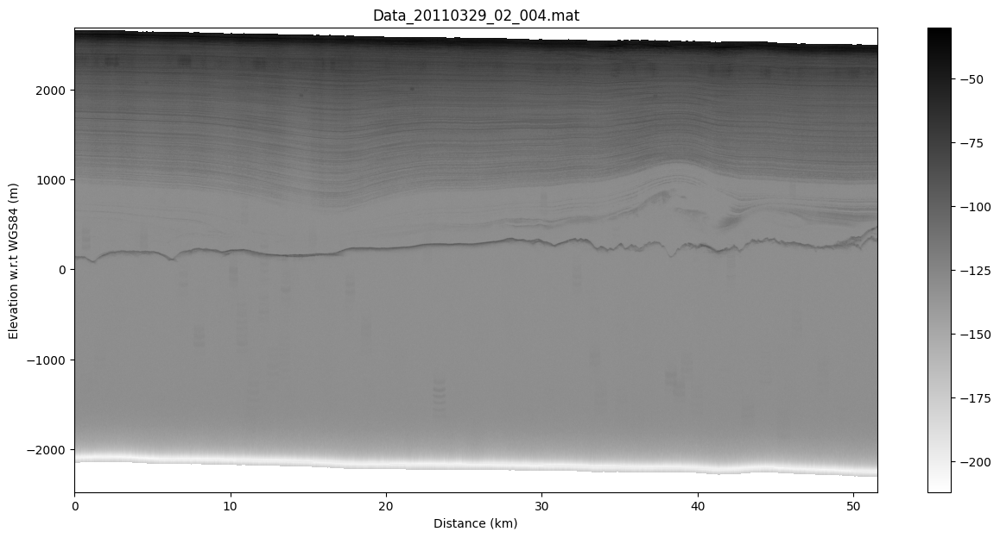

<Figure size 640x480 with 0 Axes>

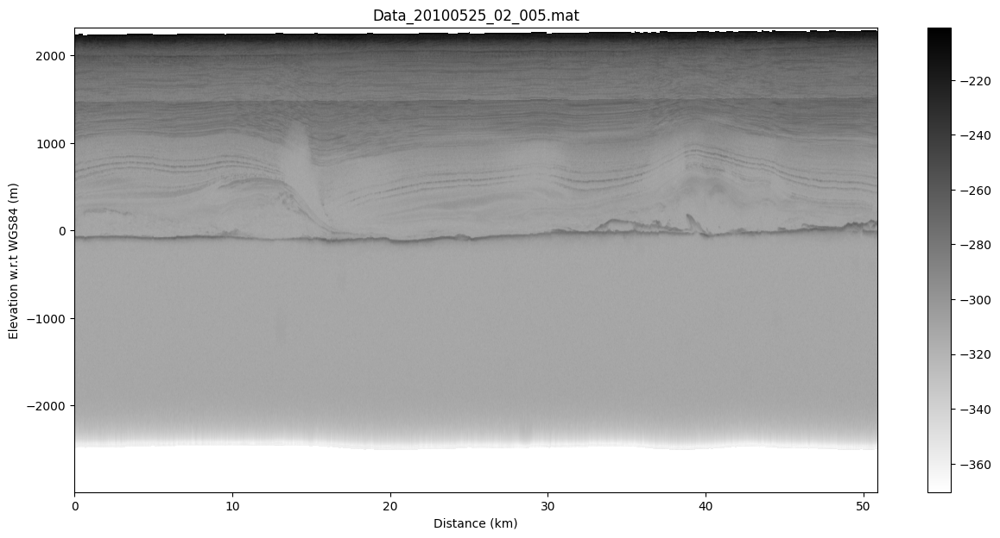

<Figure size 640x480 with 0 Axes>

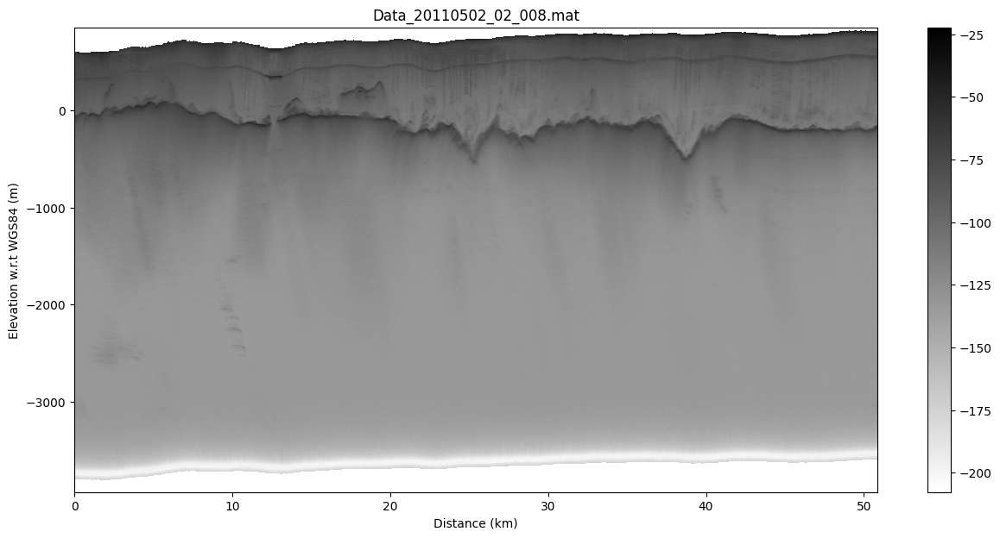

<Figure size 640x480 with 0 Axes>

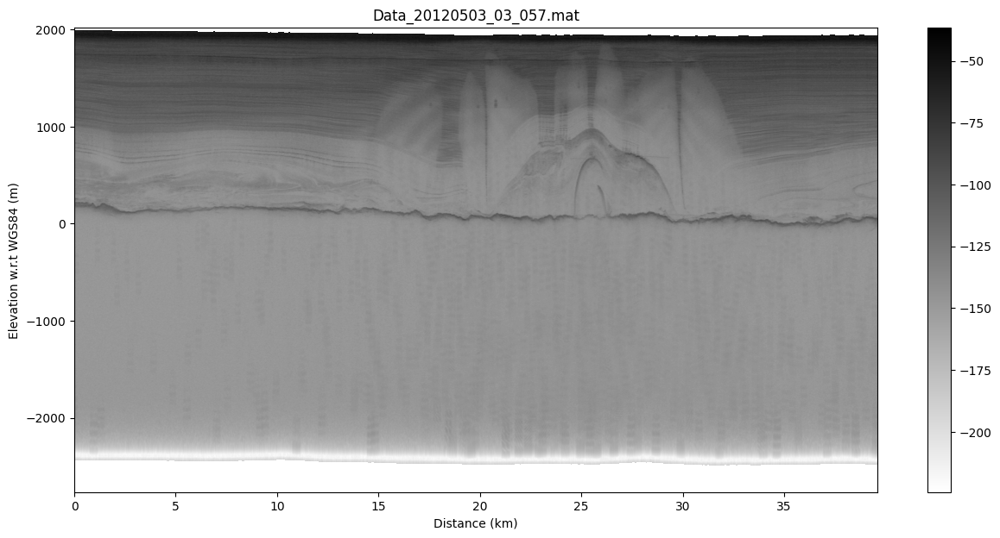

<Figure size 640x480 with 0 Axes>

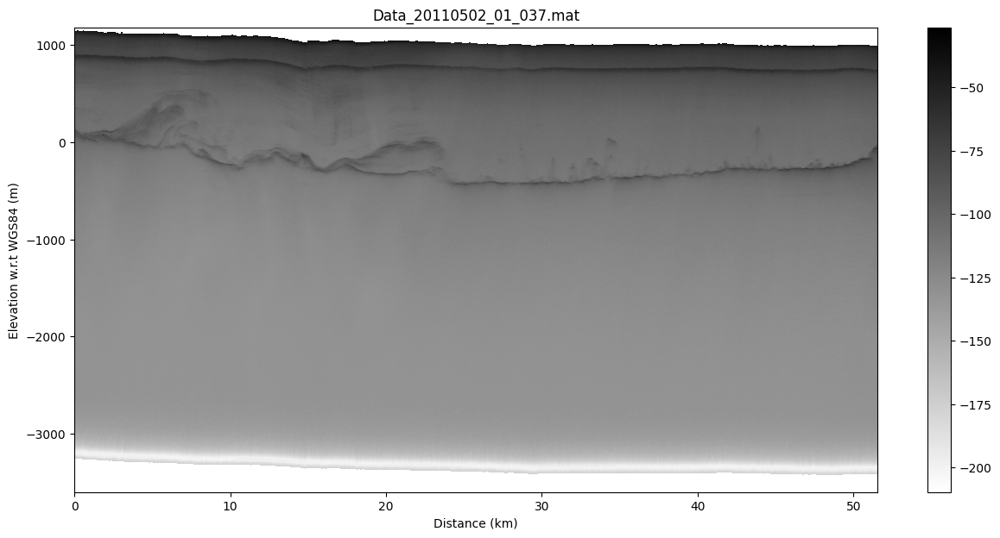

<Figure size 640x480 with 0 Axes>

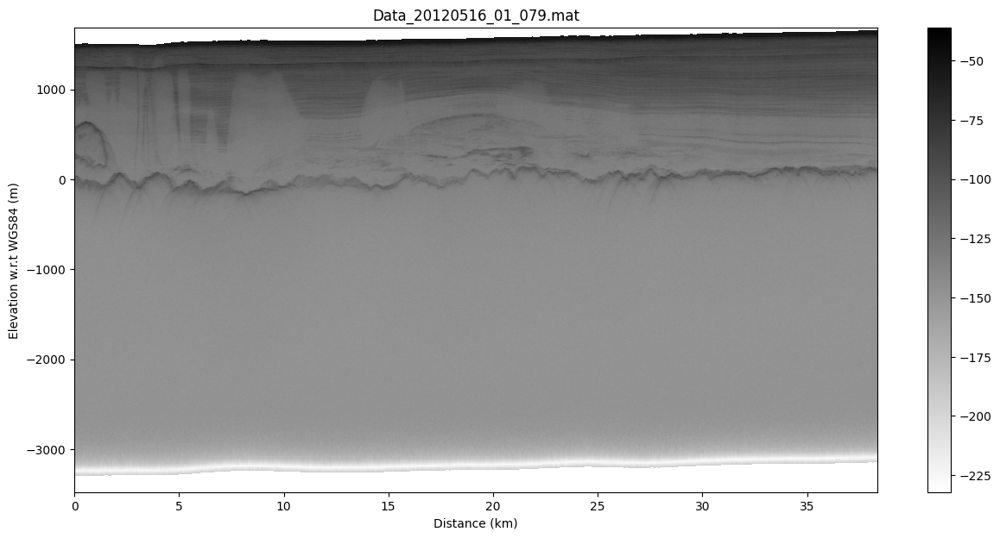

<Figure size 640x480 with 0 Axes>

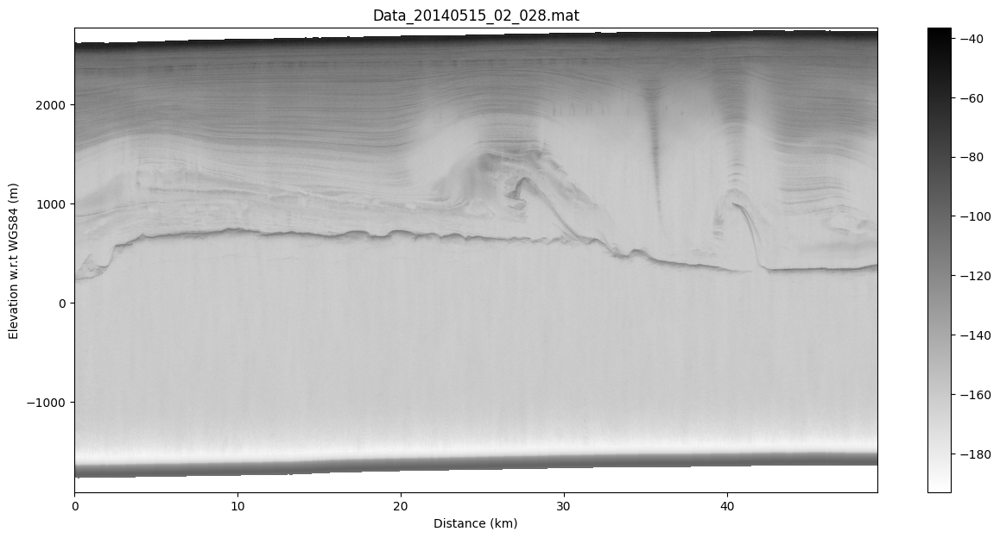

<Figure size 640x480 with 0 Axes>

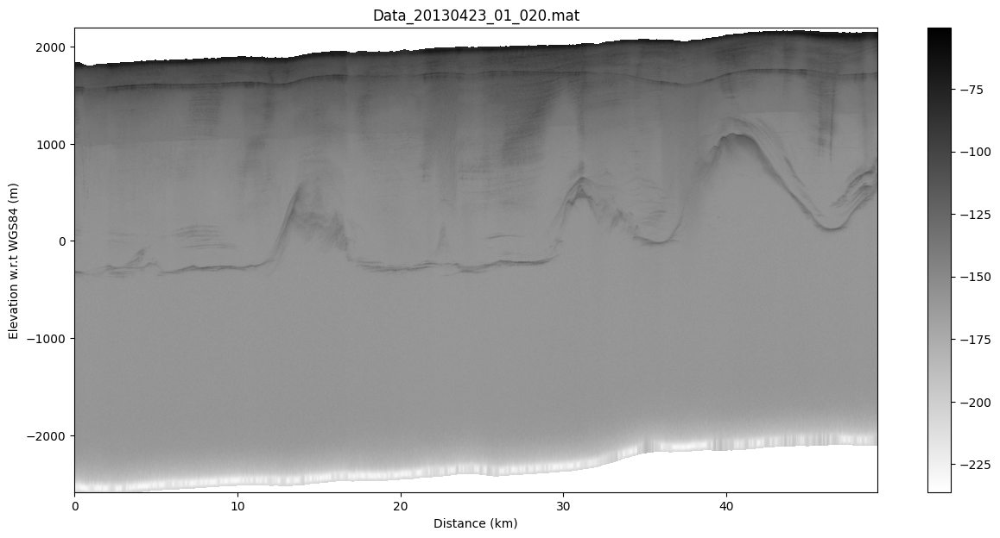

<Figure size 640x480 with 0 Axes>

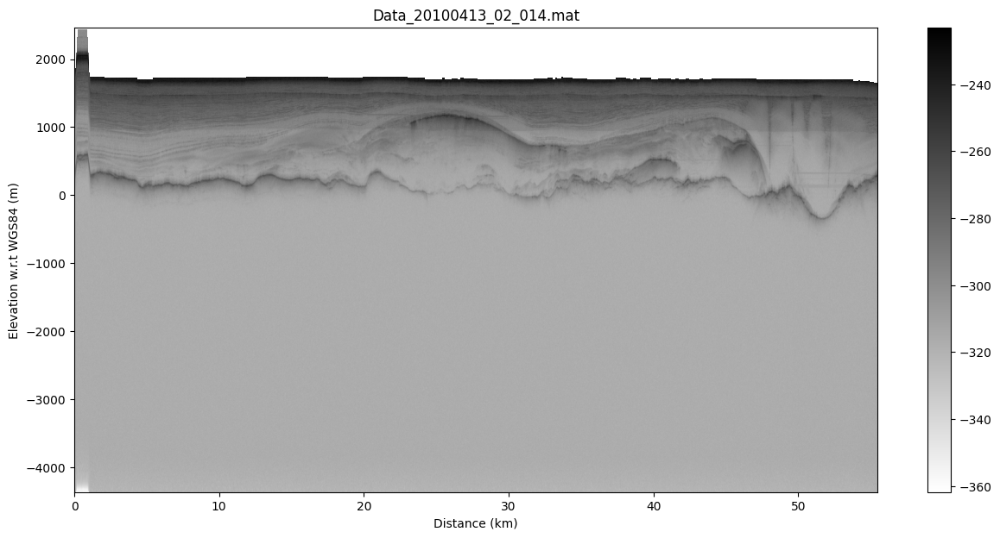

<Figure size 640x480 with 0 Axes>

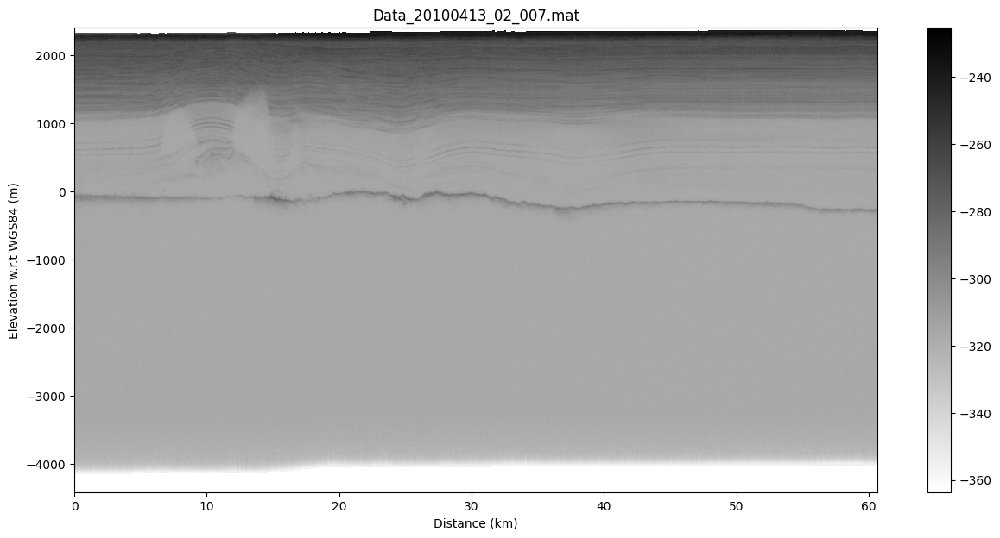

<Figure size 640x480 with 0 Axes>

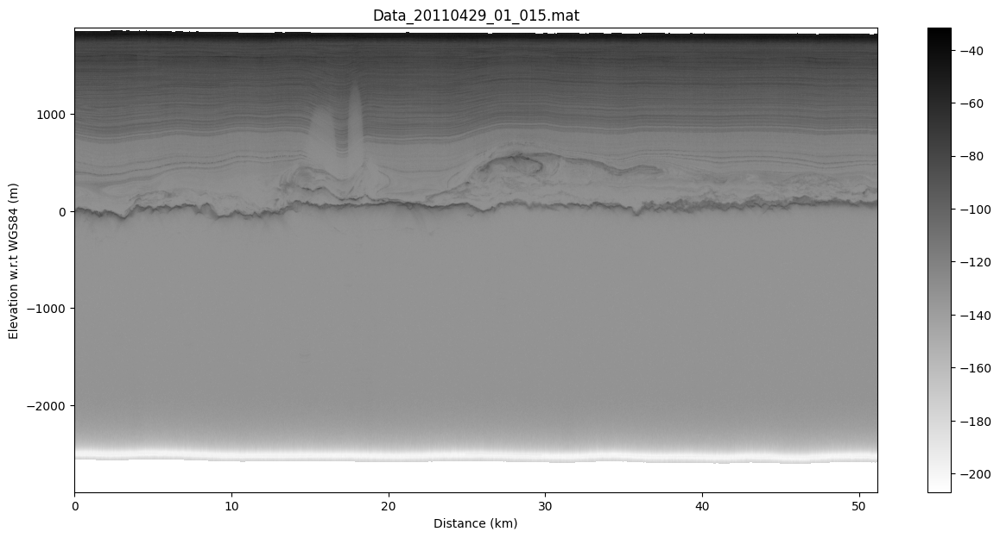

<Figure size 640x480 with 0 Axes>

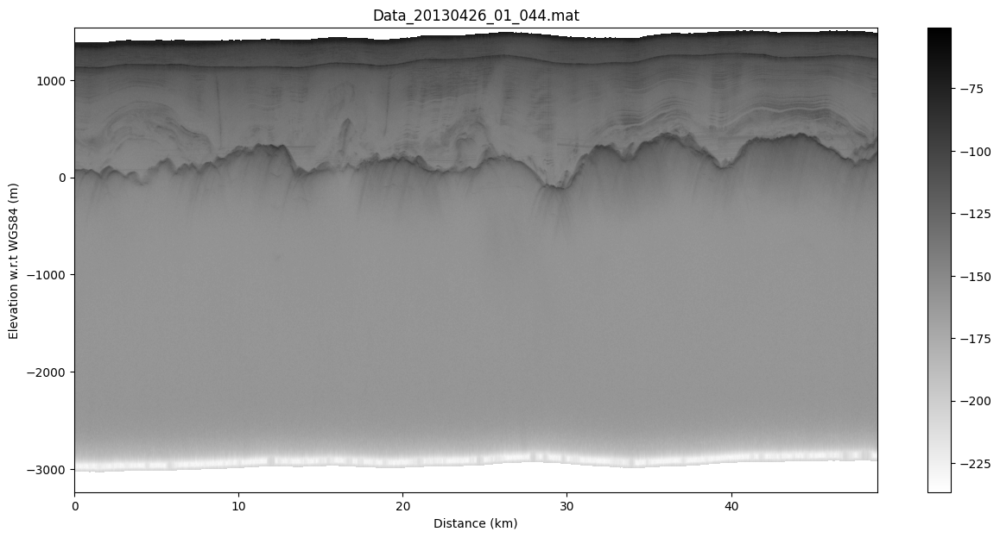

<Figure size 640x480 with 0 Axes>

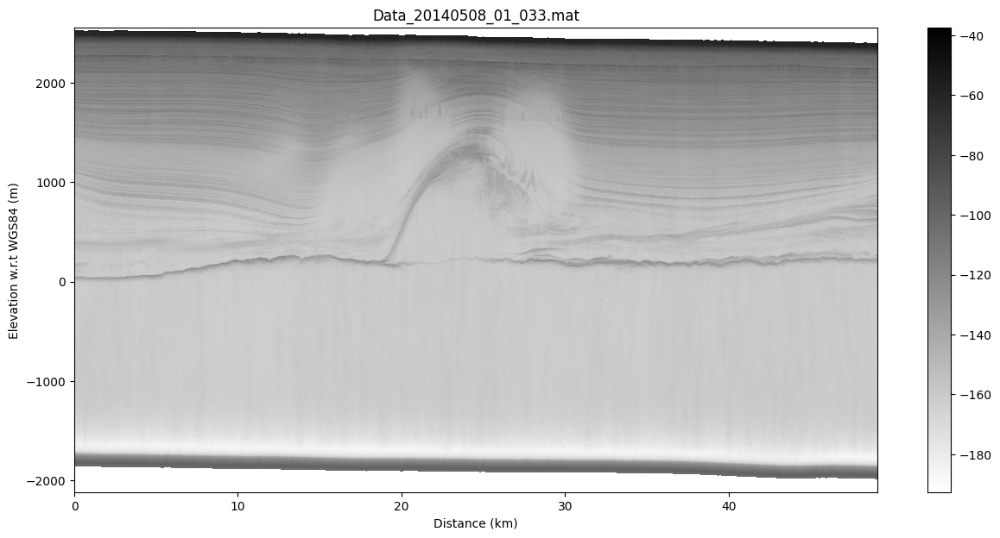

<Figure size 640x480 with 0 Axes>

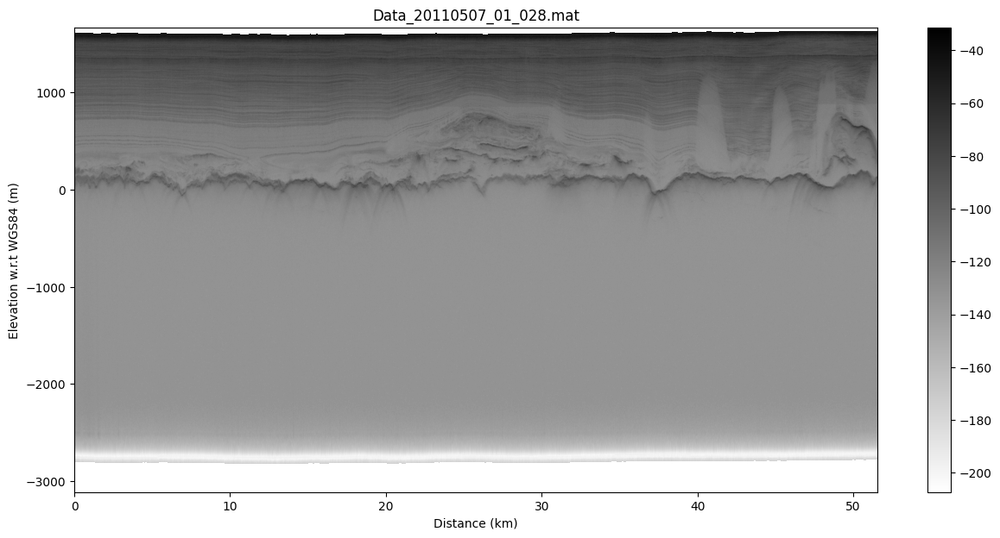

<Figure size 640x480 with 0 Axes>

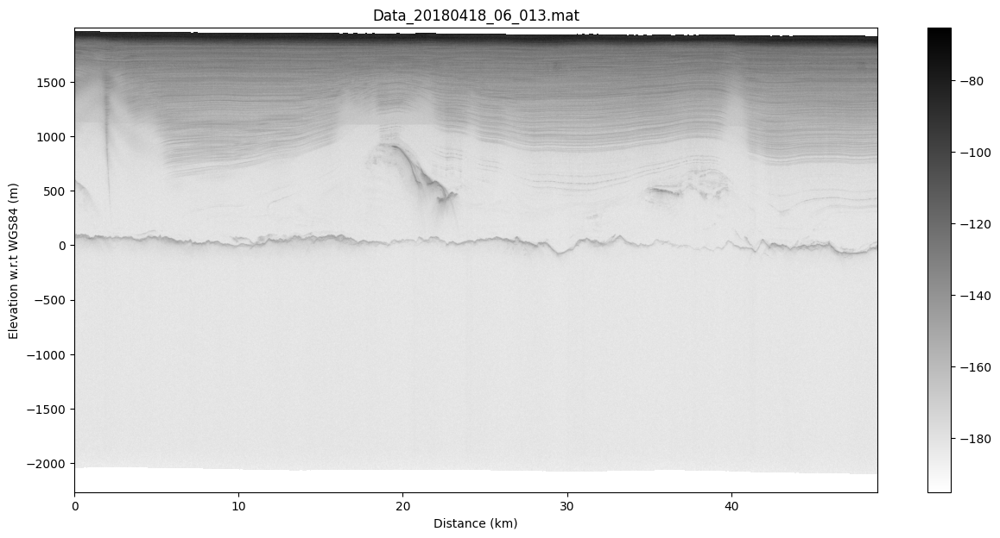

<Figure size 640x480 with 0 Axes>

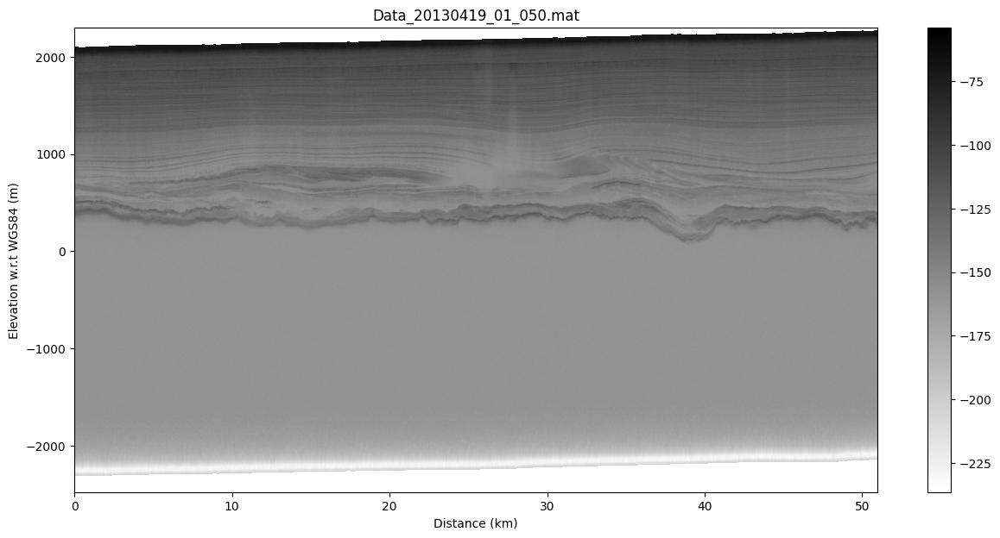

<Figure size 640x480 with 0 Axes>

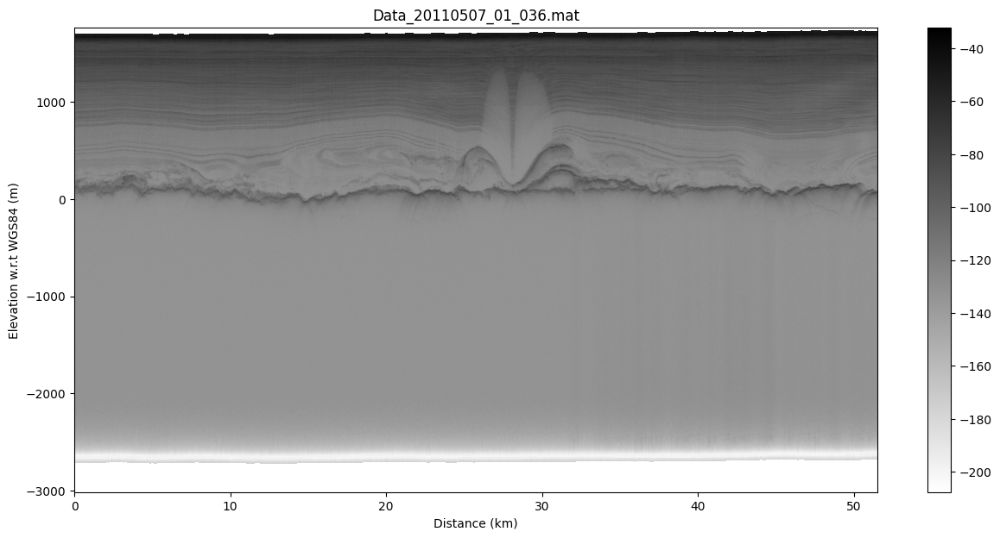

<Figure size 640x480 with 0 Axes>

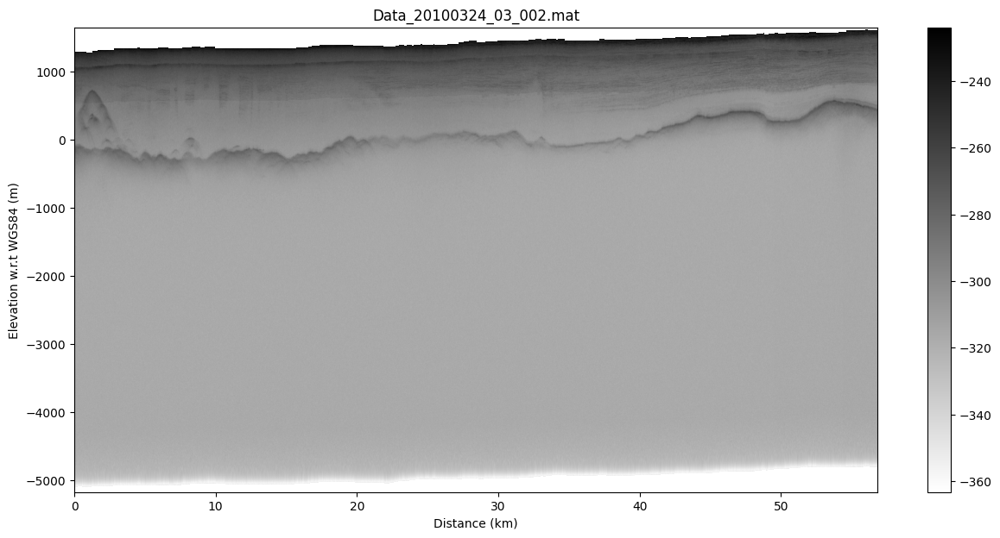

<Figure size 640x480 with 0 Axes>

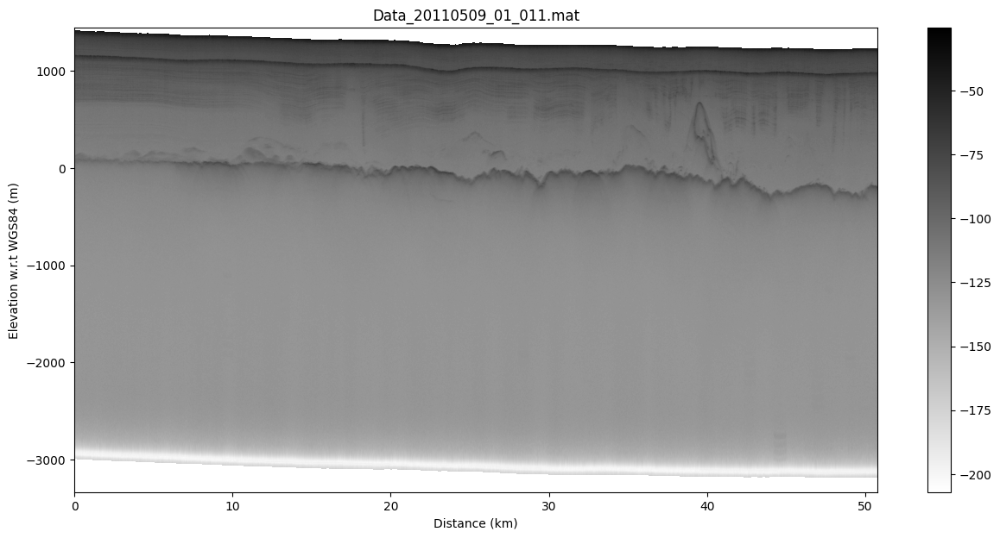

In [35]:
##############################################################
### Examine englacial reflectivity in picked files

pick_files = glob.glob('./Picks/*.mat')
for pf in pick_files[:100:5]:
    file_info = ndh.find_cresisfiles(pf.split('/')[-1])
    plt.figure()
    radar_data,depth_data = ndh.radar_load(file_info['standard'][0],1,1)
    plt.title(pf.split('/')[-1])

In [51]:
depth_data['bed_elev'][ti[0]:ti[1]]

array([], dtype=float64)

<Figure size 640x480 with 0 Axes>

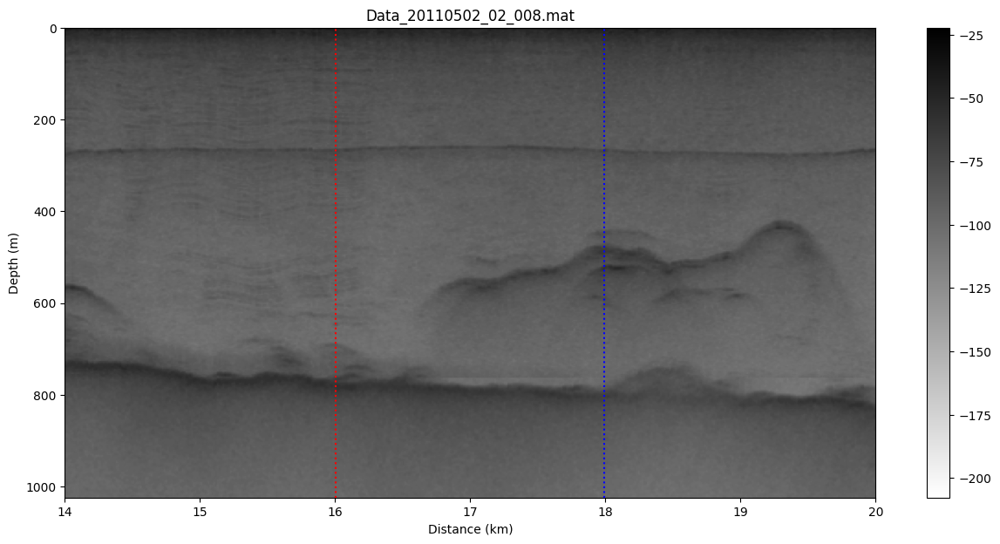

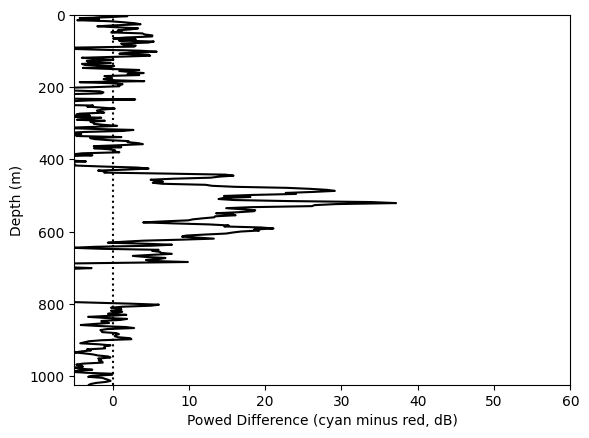

<Figure size 640x480 with 0 Axes>

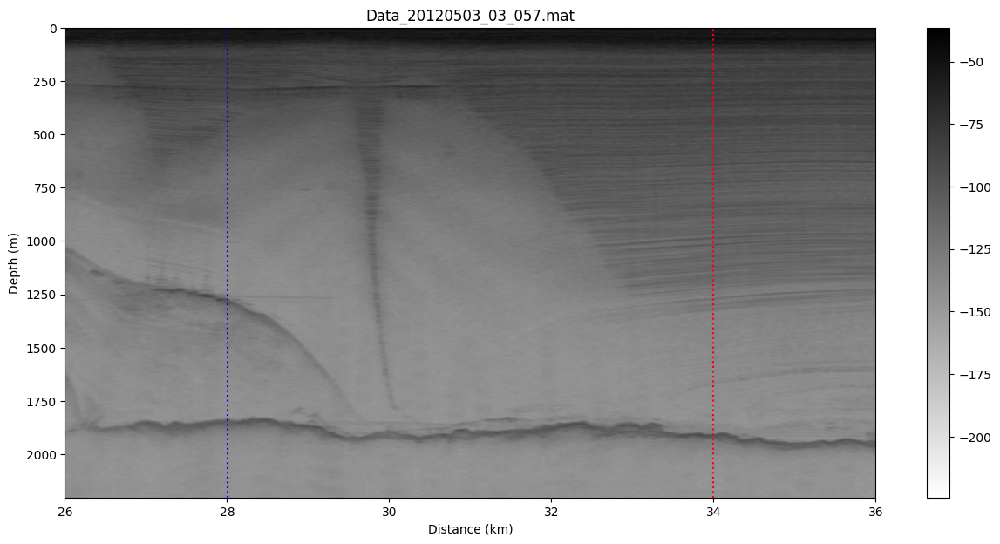

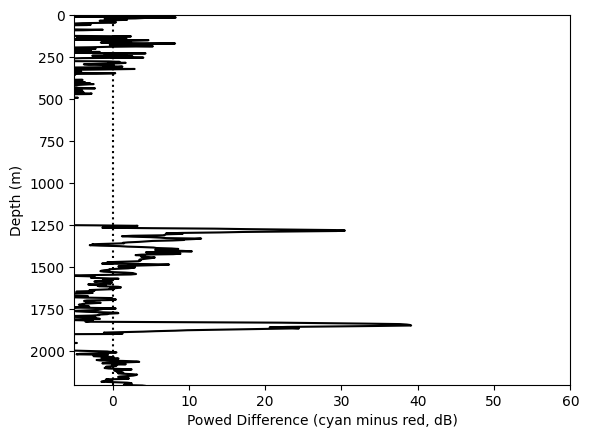

<Figure size 640x480 with 0 Axes>

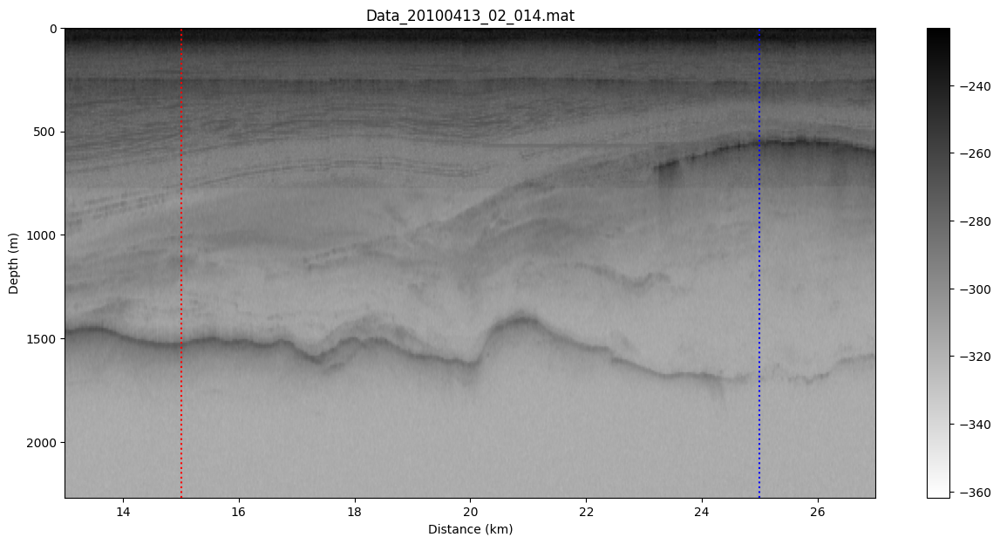

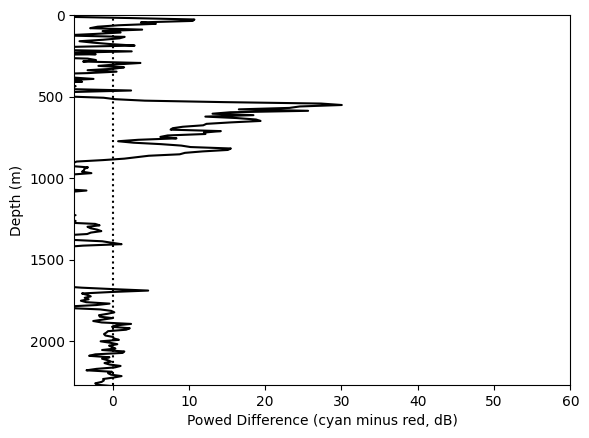

<Figure size 640x480 with 0 Axes>

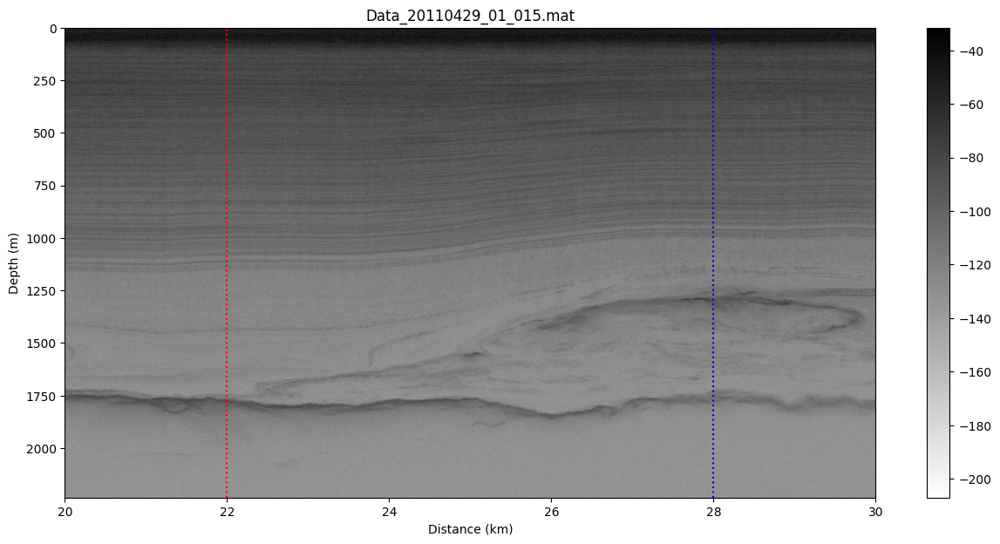

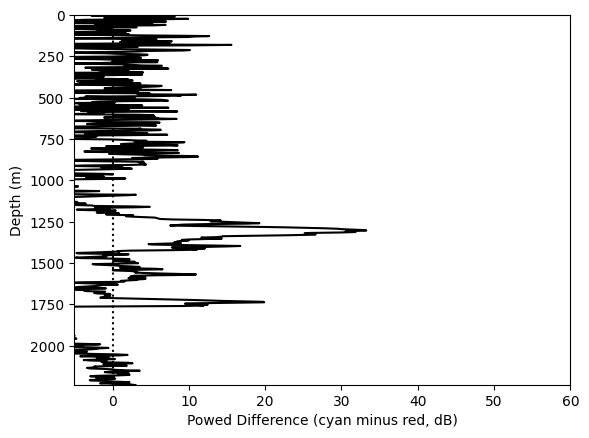

<Figure size 640x480 with 0 Axes>

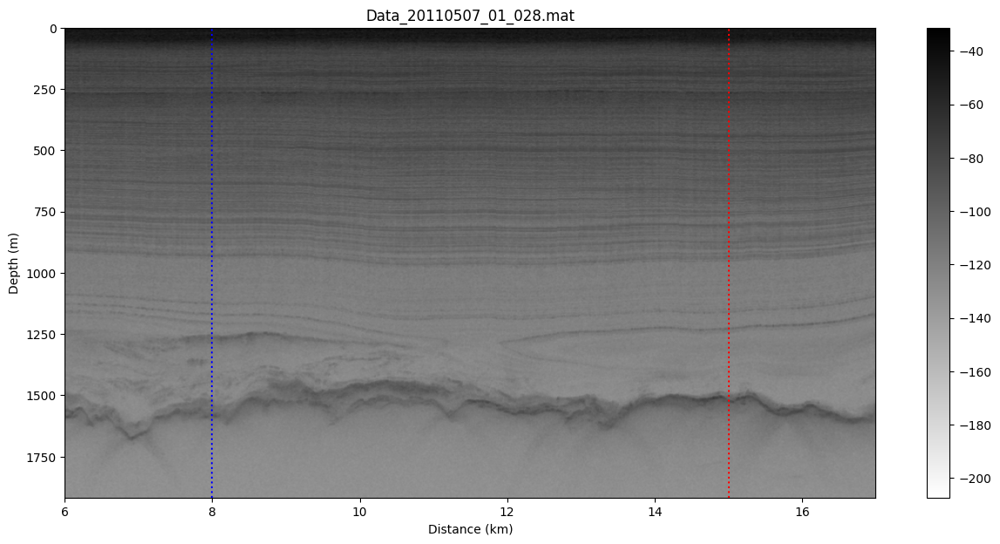

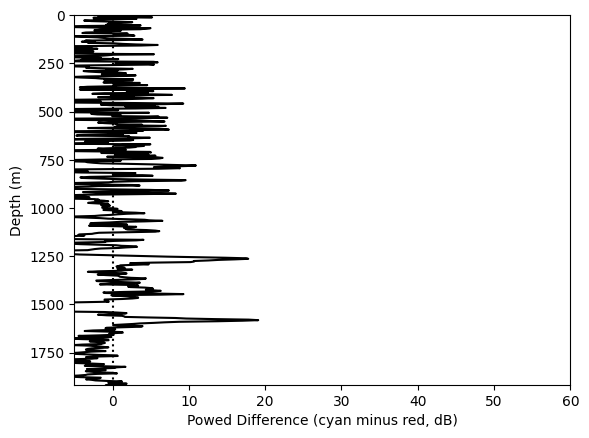

<Figure size 640x480 with 0 Axes>

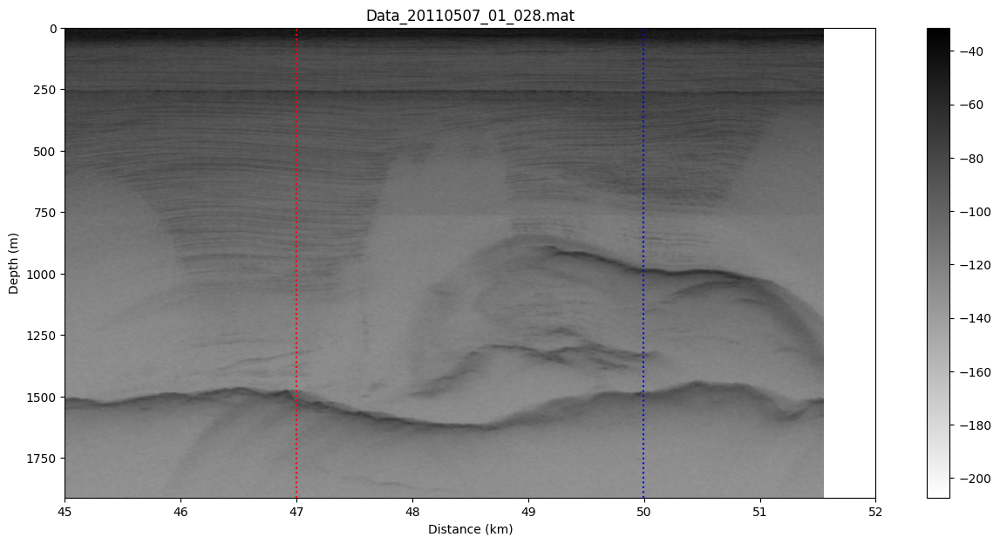

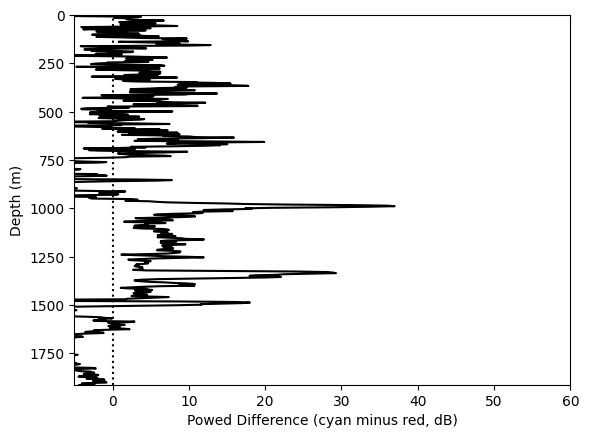

In [56]:
file_opts = [15,20,45,55,70,70]
ind_opts = [[16,18],[34,28],[15,25],[22,28],[15,8],[47,50]]

for ind in np.arange(len(file_opts)):
    
    file_info = ndh.find_cresisfiles(pick_files[file_opts[ind]].split('/')[-1])
    plt.figure()
    radar_data,depth_data = ndh.radar_load(file_info['standard'][0],1,2)
    ax = plt.gca()                     
    im = ax.images[0]                 
    #im.set_clim(vmin=-125)
    plt.ylim(2500,0)
    plt.title(pick_files[file_opts[ind]].split('/')[-1])
    
    targets = ind_opts[ind]
    ti = []
    
    for t in targets:
        temp = ndh.find_nearest(radar_data['distance'],t*1000)
        ti.append(temp['index'][0])

    targets = np.sort(np.array(targets))
    plt.xlim(targets+np.array([-2,2]))
    maxy = np.nanmax(depth_data['bed_elev'][targets[0]:targets[1]])
    plt.ylim(maxy+400,0)
    
    colors = ['red','blue']
    for ind0,t in enumerate(ti):
        plt.axvline(radar_data['distance'][t]/1000,c=colors[ind0],ls=':')

    plt.savefig('./PowerComparison_Figures/Fig_%0.2d_a.pdf' % ind)
    
    plt.figure()
    plt.plot(10*np.log10(depth_data['new_data'][:,ti[1]])-10*np.log10(depth_data['new_data'][:,ti[0]]),depth_data['depth_axis'],c='black')
    plt.axvline(0,c='black',ls=':')
    plt.ylim(maxy+400,0)
    plt.xlim(-5,60)
    plt.xlabel('Powed Difference (cyan minus red, dB)')
    plt.ylabel('Depth (m)')
    plt.savefig('./PowerComparison_Figures/Fig_%0.2d_b.pdf' % ind)

In [18]:
depth_data.keys()

dict_keys(['new_data', 'shift_amount', 'depth_axis', 'surface_elev', 'bed_elev', 'multiple'])

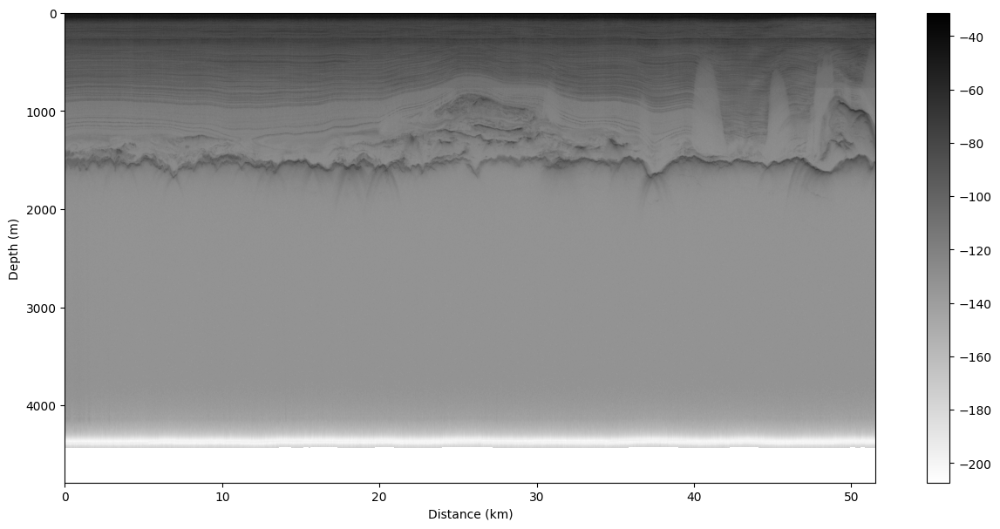

In [41]:

    radar_data,depth_data = ndh.radar_load(file_info['standard'][0],1,2)

In [42]:
radar_data['distance']

array([0.00000000e+00, 1.35164144e+01, 2.70336747e+01, ...,
       5.15263314e+04, 5.15398569e+04, 5.15533813e+04])

In [59]:
np.median(np.diff(depth_data['depth_axis']))

np.float64(2.815231904602342)